# Overview

This notebook is a walkthrough of the steps of Tessera, for those who want to get more familiar with the components. 






# Libs

In [1]:
suppressPackageStartupMessages({
    library(tessera)

    ## Plotting functions 
    ## Not imported by Tessera
    library(ggplot2)
    library(ggthemes)
    library(viridis)
    library(patchwork)
})

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}



# Parameters

In [2]:
verbose = TRUE
show_plots = TRUE

###### STEP 0 ######
npcs = 10
## Graph pruning
prune_thresh_quantile = 0.95
prune_min_cells = 10


###### STEP 1: GRADIENTS ######
smooth_distance = c('none', 'euclidean', 'projected', 'constant')[3] 
smooth_similarity = c('none', 'euclidean', 'projected', 'constant')[3] 


###### STEP 2: DMT ######
## ... no options


###### STEP 3: AGGREGATION ######
max_npts = 50
min_npts = 5
alpha = 1 ## 0.2 = conservative merging, 2 = liberal merging 



# Data

Small sample MERFISH dataset from Chen et al: 

https://www.biorxiv.org/content/10.1101/2023.04.04.535379v1.abstract


In [3]:
data('tessera_warmup')
counts = tessera_warmup$counts
meta_data = tessera_warmup$meta_data
meta_vars_include = c('type')


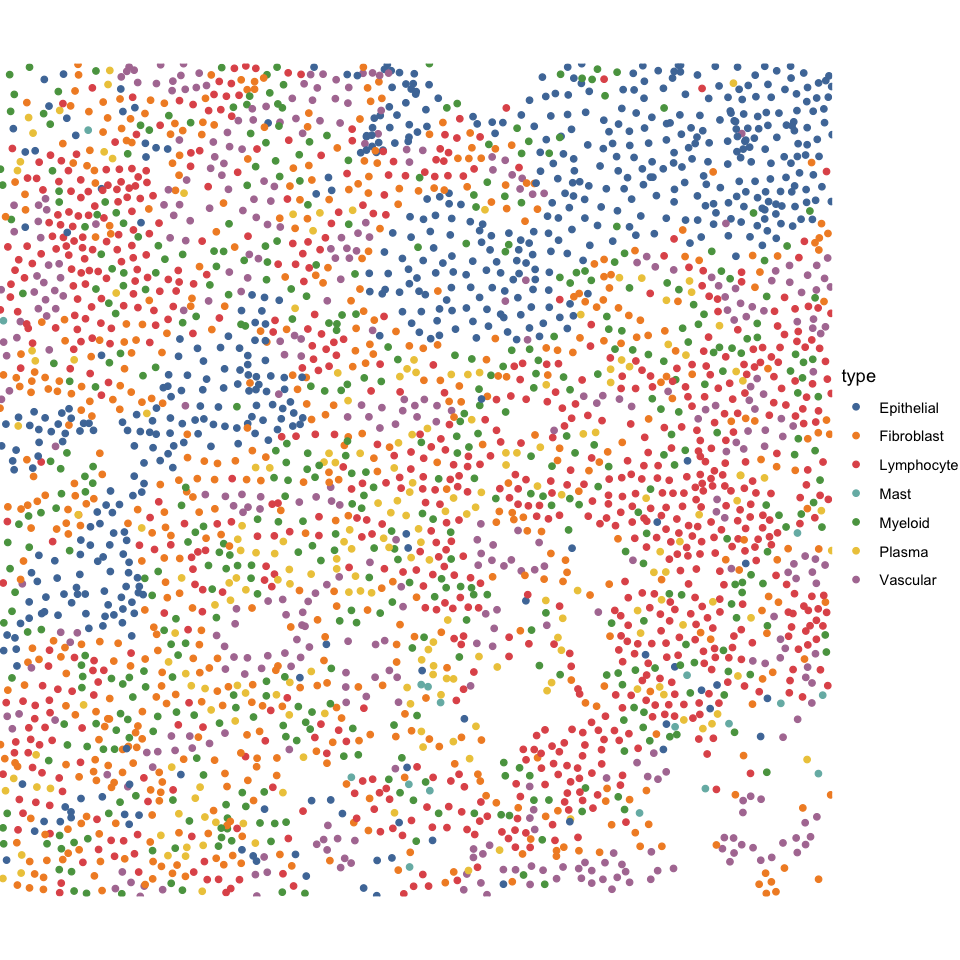

In [4]:
fig.size(8, 8)
ggplot() + 
    geom_point(data = meta_data, aes(X, Y, color = type)) + 
    theme_void() + 
    scale_color_tableau() + 
    coord_sf(expand = FALSE) + 
    NULL


Some coarse and fine grained cell types are predefined here, to help interpret the tiles we get below. 

In [5]:
table(meta_data$type)


Epithelial Fibroblast Lymphocyte       Mast    Myeloid     Plasma   Vascular 
       634        588        829         18        491        206        411 

## prepare

In [6]:
dmt = init_data(meta_data$X, meta_data$Y, counts, meta_data, meta_vars_include)
dmt = prune_graph(dmt, thresh_quantile = prune_thresh_quantile, mincells = prune_min_cells) 

In [7]:
dmt = add_exterior_triangles(dmt)

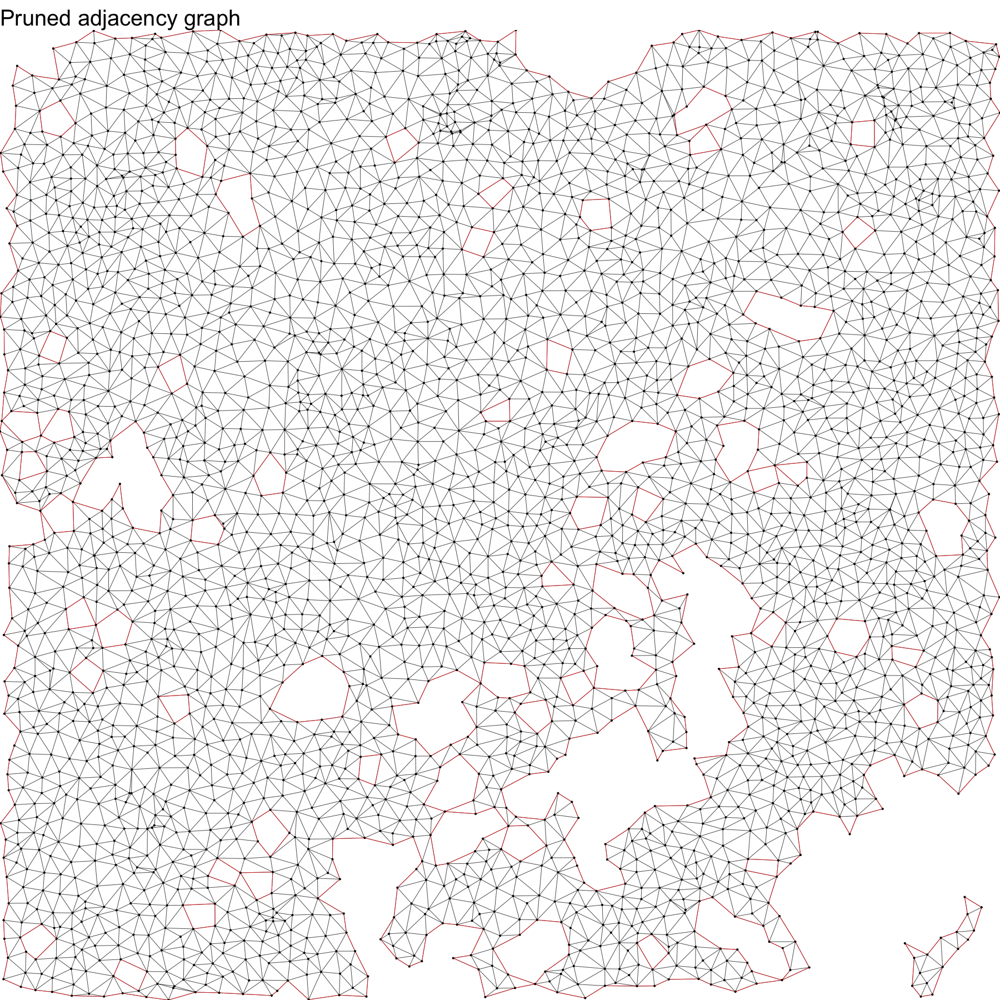

In [8]:
fig.size(15, 15)
# fig.size(20, 20)

if (show_plots) {    
    ggplot() + 
    
        # ## big data 
        # geom_point(data = dmt$pts, aes(X, Y), shape = '.', alpha = .1) + 
        # geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red', lwd = .2) + 
    
        ## small data 
        geom_segment(data = dmt$edges, aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'black', lwd = .2) + 
        geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red', lwd = .2) + 
        geom_point(data = dmt$pts, aes(X, Y), size = .5) + 
    
        theme_void(base_size = 20) + 
        coord_cartesian(expand = FALSE) + 
        labs(title = 'Pruned adjacency graph') + 
        NULL
}


## pca

In [9]:
dmt$udv_cells = do_pca(dmt$counts, npcs)


# Step 1: compute gradients on all data structures

In [10]:
field = compute_gradients(dmt, smooth_distance, smooth_similarity)
field = compress_gradients_svd(field)


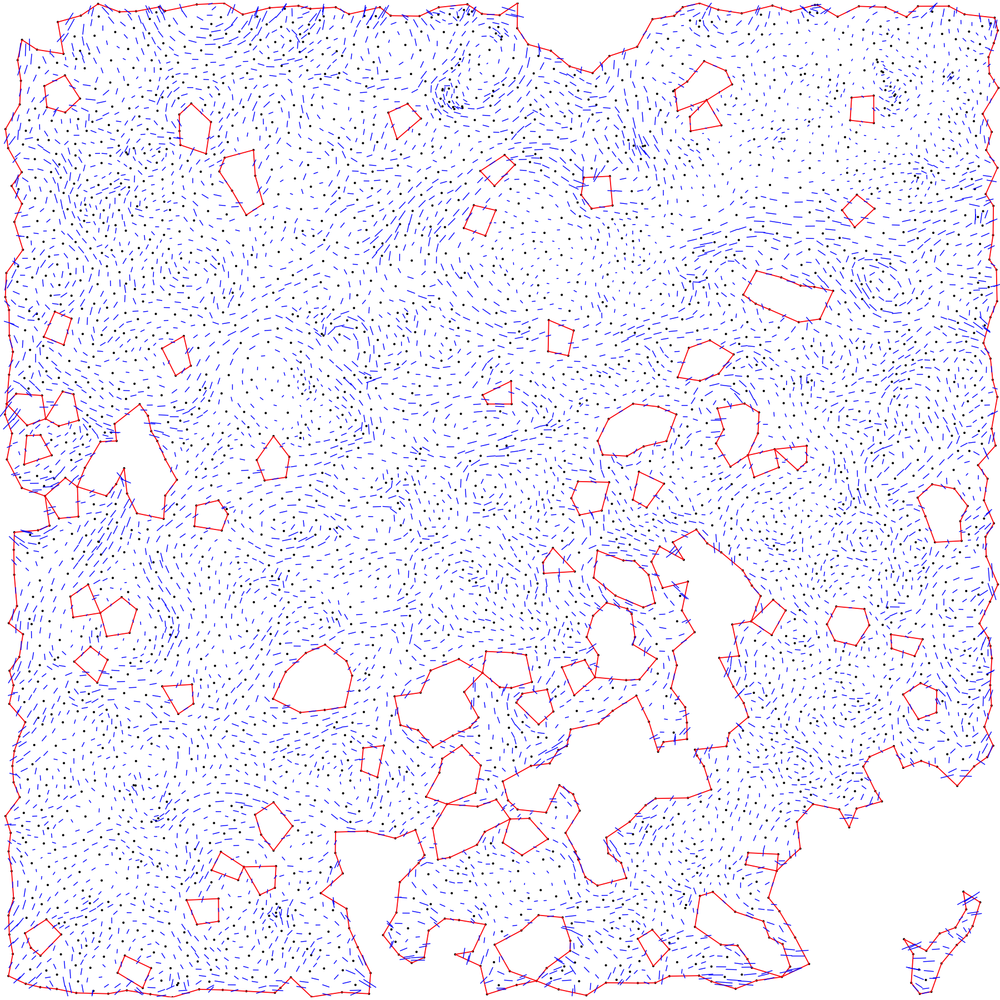

In [11]:
if (show_plots) {    

    len_plot_constant = .8
    fig.size(15, 15)
    # fig.size(20, 20)
    ggplot() + 
        geom_point(data = dmt$pts, aes(X, Y), size = .5) + 
        geom_segment(data = dmt$edges[boundary == TRUE, ], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red') + 
    
        ## Triangle Gradients
        geom_segment(
            data = data.table(dmt$tris, field$tris_svd), 
            aes(
                x=X-len_plot_constant*(len_grad+len_ortho)*dx_ortho, 
                y=Y-len_plot_constant*(len_grad+len_ortho)*dy_ortho, 
                xend=X+len_plot_constant*(len_grad+len_ortho)*dx_ortho, 
                yend=Y+len_plot_constant*(len_grad+len_ortho)*dy_ortho
            ), 
            linewidth = .4, alpha = 1, 
            color = 'blue'
        ) + 
    
        theme_void() + 
        coord_fixed(expand = FALSE) + 
        NULL
}


# Step 2: DMT


## compute f

In [12]:
dmt = dmt_set_f(dmt, field)

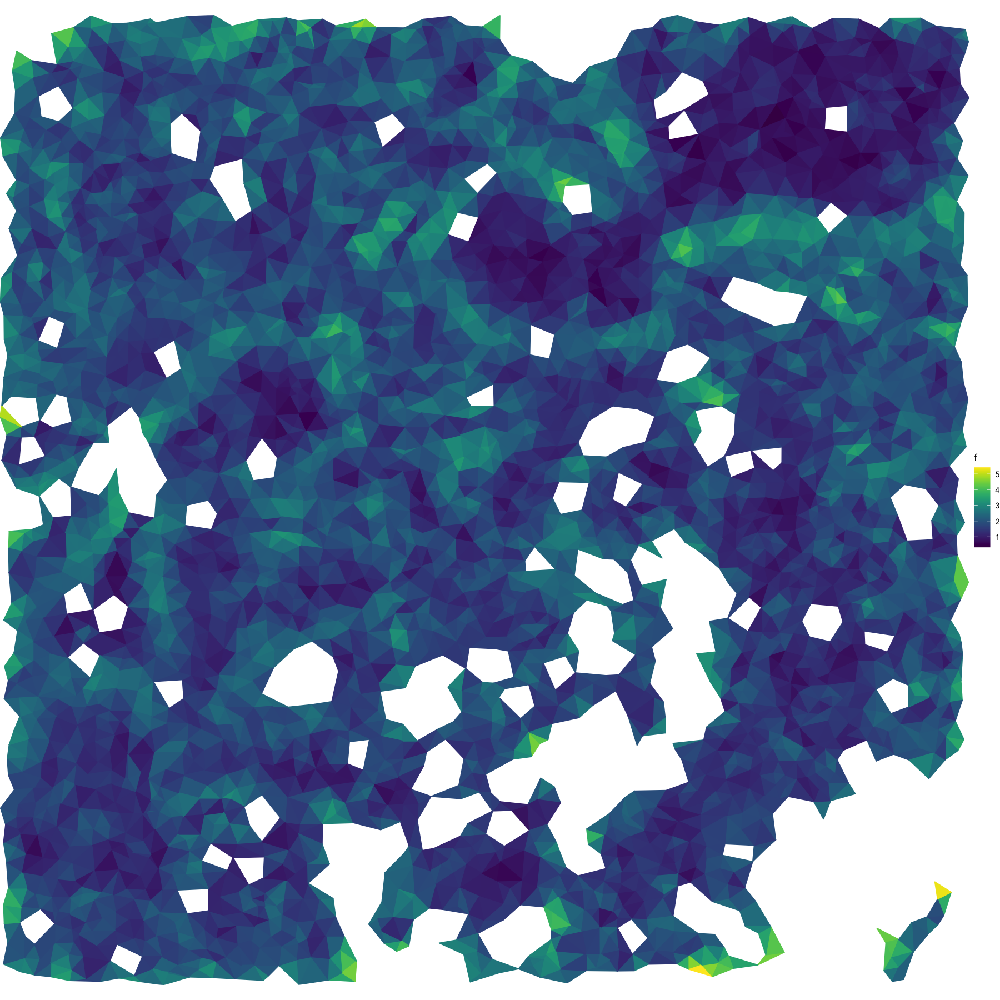

In [13]:
if (show_plots) {    
    ntri = max(which(dmt$tris$external == FALSE))
    i = Matrix::t(dmt$tri_to_pt[1:ntri, ])@i+1
    plt_df = data.table(
        X = dmt$pts$X[i],
        Y = dmt$pts$Y[i],
        f = rep(dmt$tris$f[1:ntri], each = 3)
    )[
        , id := rep(1:ntri, each = 3)
    ][]
    
    
    fig.size(15, 15)
    ggplot() + 
        geom_polygon(data = plt_df, aes(X, Y, group = id, fill = f, color = f)) + 
        theme_void() + 
        coord_fixed(expand = FALSE) + 
        scale_fill_viridis() + 
        scale_color_viridis() + 
        NULL
}

## forests

In [14]:
dmt$prim = do_primary_forest(dmt)
dmt$dual = do_dual_forest(dmt)


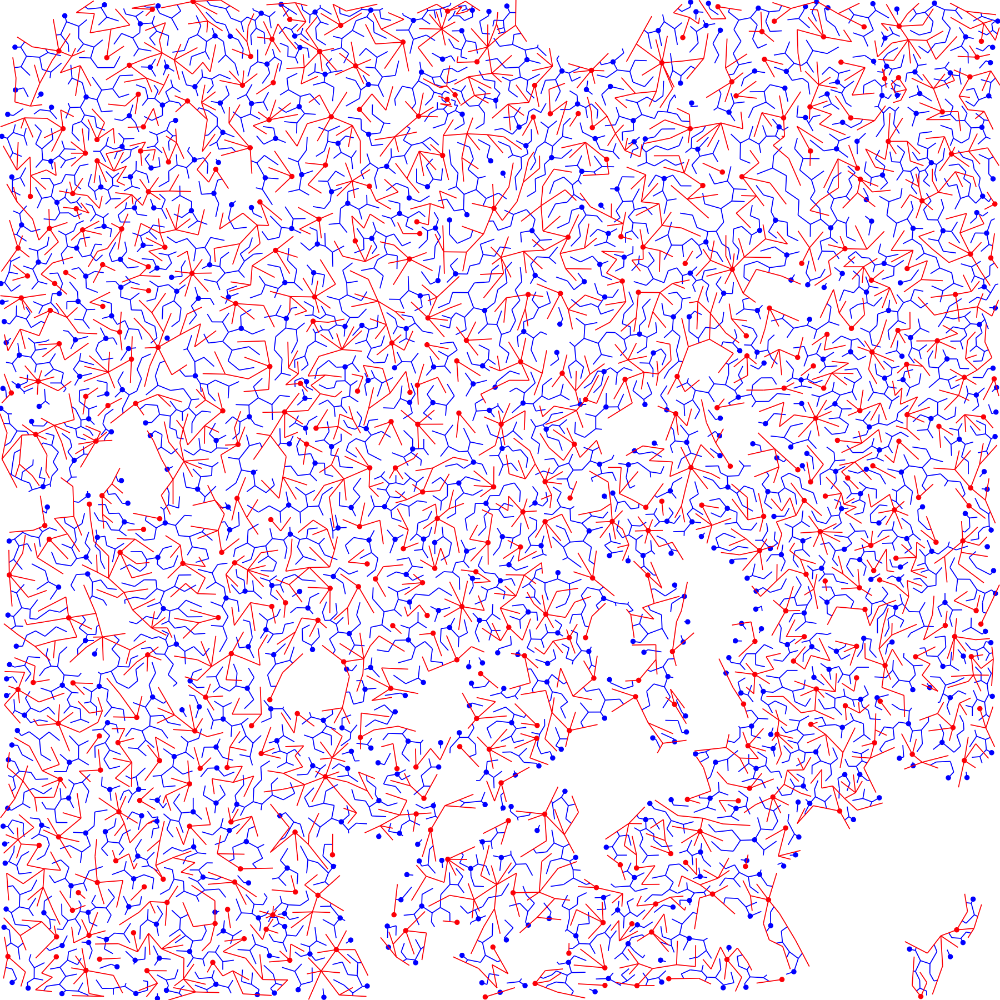

In [15]:
if (show_plots) {    
    fig.size(15, 15)
    ggplot() +     
        ## primary forest
        geom_point(data = dmt$tris[dmt$dual$maxima, ], aes(X, Y), color = 'blue', size = 2) + 
        geom_segment(data = dmt$dual$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'blue') + 

        ## primary forest
        geom_point(data = dmt$pts[dmt$prim$minima, ], aes(X, Y), color = 'red', size = 2) + 
        geom_segment(data = dmt$prim$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'red') + 
    
        theme_void() + 
        coord_cartesian(expand = FALSE) + 
        NULL
}


## extract epaths

In [16]:
dmt$e_sep = dmt_get_separatrices(dmt)

After DMT, we have a separatrix (in blue) and the primary forest connecting points (in red). 


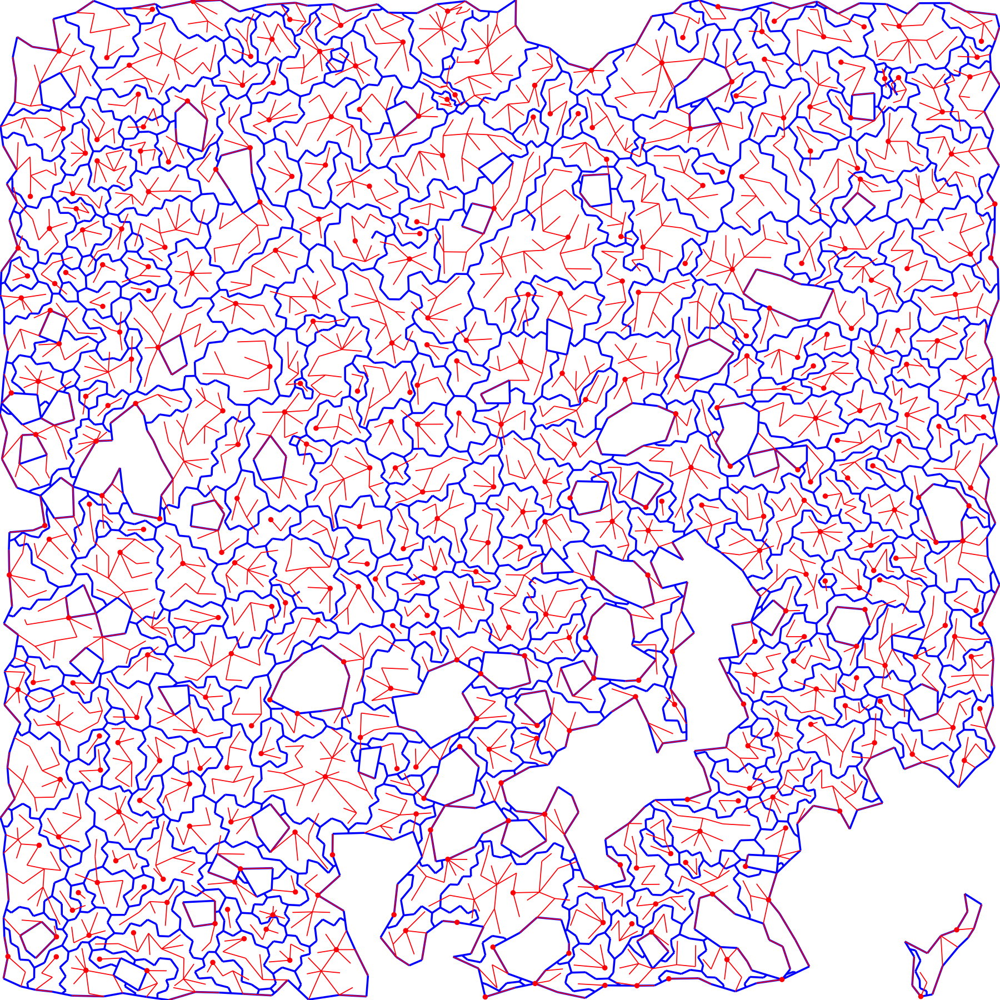

In [17]:
if (show_plots) {    
    fig.size(15, 15)
    ggplot() + 
    
        geom_segment(data = dmt$edges[dmt$e_sep, ], aes(x = x0_tri, y = y0_tri, xend = x1_tri, yend = y1_tri), lwd = 1, color = 'blue') + 
        geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'blue', lwd = 1) + 
    
        ## primary forest
        geom_point(data = dmt$pts[dmt$prim$minima, ], aes(X, Y), color = 'red', size = 2) + 
        geom_segment(data = dmt$prim$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'red') + 
    
        theme_void() + 
        coord_cartesian(expand = FALSE) + 
        NULL
}

## extract tiles



In [18]:
dmt = dmt_assign_tiles(dmt)
aggs = dmt_init_tiles(dmt)

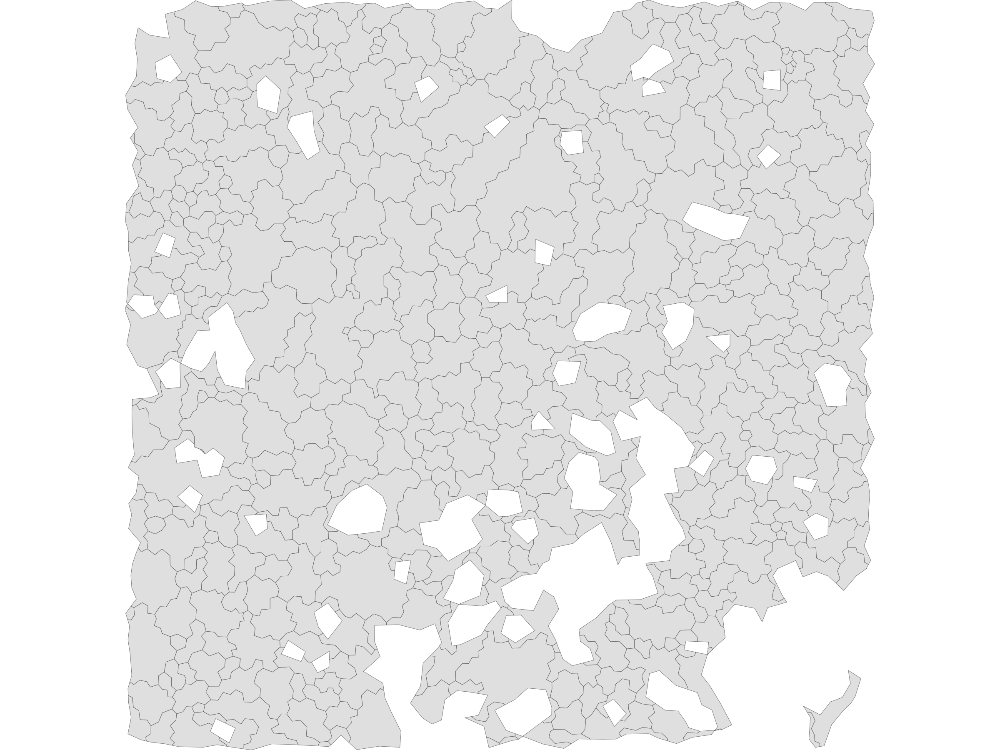

In [19]:
if (show_plots) {    
    set.seed(2)
    fig.size(15, 20)
    ggplot() + 
        geom_sf(data = aggs$meta_data$shape) + 
        # geom_point(data = dmt$pts, aes(X, Y, color = factor(agg_id, sample(nrow(aggs$meta_data)))), size = 1) + 
        # scale_color_tableau() + 
        theme_void() + 
        coord_sf(expand = FALSE) + 
        # coord_cartesian(expand = FALSE) + 
        guides(color = 'none') + 
        
        NULL 
}

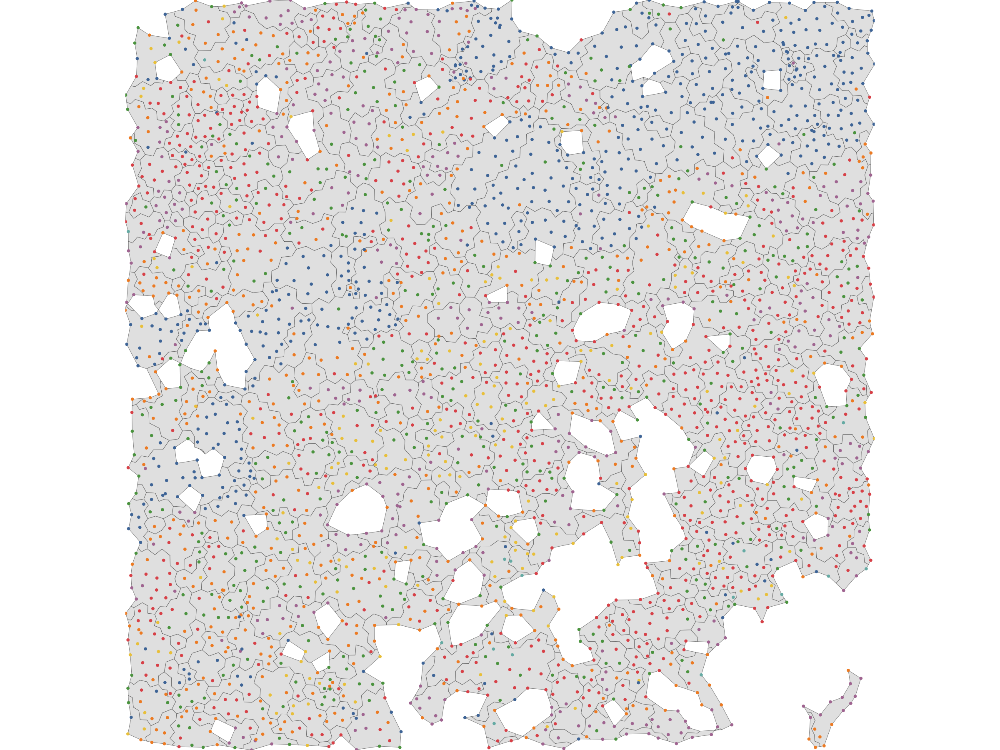

In [20]:
if (show_plots) {    
    set.seed(2)
    fig.size(15, 20)
    ggplot() + 
        geom_sf(data = aggs$meta_data$shape) + 
        geom_point(data = dmt$pts, aes(X, Y, color = type)) + 
        theme_void() + 
        coord_sf(expand = FALSE) + 
        scale_color_tableau() + 
        guides(color = 'none') + 
        NULL 
}

# Step 3: Aggregation

## Merge main

First, merge similar aggregates that are nearby. 


In [21]:
aggs = init_scores(aggs, agg_mode=2, alpha=alpha, max_npts=max_npts)
aggs = merge_aggs(aggs, agg_mode=2, max_npts=max_npts)
dmt = update_dmt_aggid(dmt, aggs)
aggs = update_agg_shapes(dmt, aggs)

## Merge small outliers

Then go ahead and merge small clusters that are smaller than 


In [22]:
aggs = init_scores(aggs, agg_mode=3, alpha=alpha, min_npts=min_npts)
aggs = merge_aggs(aggs, agg_mode=3, min_npts=min_npts)
dmt = update_dmt_aggid(dmt, aggs)
aggs = update_agg_shapes(dmt, aggs)

## Final tiles 

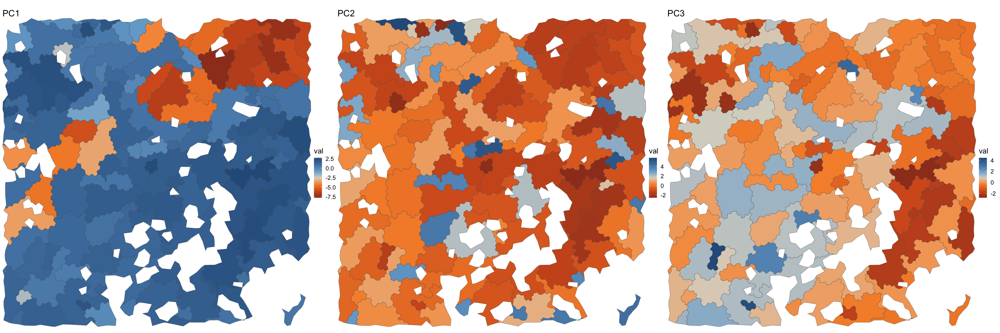

In [23]:
fig.size(10, 30)
if (show_plots) { 
    purrr::map(1:3, function(i) {
        ggplot(cbind(aggs$meta_data, val=aggs$pcs[, i])) + 
            geom_sf(aes(geometry = shape, fill = val)) + 
            theme_void(base_size = 16) + 
            coord_sf(expand = FALSE) + 
            scale_fill_gradient2_tableau() + 
            guides(color = 'none') + 
            labs(title = paste0('PC', i)) + 
            NULL 
    }) %>% 
        purrr::reduce(`|`)
}

# Results

## Aggregates 

The primary output is the tiles. Each tile has a row in the meta_data table: 

- npts denotes the number of cells in the tile. 



In [24]:
head(aggs$meta_data)

id,X,Y,npts,shape,area,perimeter
<int>,<dbl>,<dbl>,<dbl>,<GEOMETRY>,<dbl>,<dbl>
1,5575.126,10072.15,43,POLYGON ((5598.428 10051.98...,3028.5702,393.79103
2,5551.504,10104.73,35,POLYGON ((5572.969 10116.07...,2320.2439,270.48266
3,5577.735,10114.87,8,POLYGON ((5572.969 10116.07...,651.2121,139.60497
4,5565.044,10019.62,41,"POLYGON ((5614.379 10006.3,...",2292.7048,317.27844
5,5534.221,10048.70,7,POLYGON ((5537.904 10040.62...,387.4860,87.17964
6,5515.949,10052.62,33,POLYGON ((5513.932 10008.66...,2012.1687,252.01537


We also have pooled gene counts, for differential gene expression analysis. 

In [25]:
aggs$counts[1:5, 1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
      1 2 3 4 5
ACE   3 2 1 1 .
ACKR1 . 1 . . .
ACKR2 1 . . . .
ACKR3 . 1 . 1 .
ACKR4 . . . . .

And we have PCA embeddings for the tiles. 

In [26]:
head(aggs$pcs)

PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0.4825579,0.8655010,0.7482536,-1.7295154,0.72493548,-0.09225811,-0.7315589,-0.6213994,-0.2676081,-0.07145101
1.2049713,-0.4606094,1.2644548,-0.5915905,0.88324376,-0.05540783,-0.9391629,-0.5750840,-0.1579376,0.16274963
1.3895474,-1.5392132,4.4464253,1.3297266,1.26997762,-0.95557892,-0.3429736,-0.1472482,1.1103697,0.34060965
1.5045535,0.5159752,1.6467592,-0.7636852,0.52567053,-0.32880955,0.2752555,-0.4348756,0.2355197,0.28518495
-1.8997925,0.2528658,0.1246703,-0.8315790,-0.05534974,-0.52082111,-2.5338185,1.1466404,1.1236109,-0.40210877
1.3016723,-0.3290007,0.4484454,-1.0768298,0.59484589,0.70384283,-0.8923629,-0.2867486,0.2800958,1.22910049


The rest of the fields are internal to the algorithm and can be ignored. 

In [27]:
setdiff(names(aggs), c('pcs', 'meta_data', 'counts'))

[1] "edges"      "pcs_merged" "d_mu"       "d_sig"      "aggmap"

## Points

We also keep information about the cells in `dmt`. Most of the fields are duplicates of the inputs and some intermediate results. 



In [28]:
names(dmt)

[1] "pts"       "tris"      "edges"     "tri_to_pt" "counts"    "udv_cells"
[7] "prim"      "dual"      "e_sep"

The important fields to keep for further analyses are: 

- ORIG_ID: the index of the cell in the input data. Some cells get filtered out as outliers, so not all input cells get assigned to an aggregate. 
- agg_id: the index of the tile in the `aggs` data structures above. 



In [29]:
head(dmt$pts[, .(ORIG_ID, agg_id)])

ORIG_ID,agg_id
<int>,<int>
1,1
2,1
3,2
4,3
5,4
6,4


# Session Info

In [30]:
sessionInfo()

R version 4.4.1 (2024-06-14)
Platform: x86_64-apple-darwin13.4.0
Running under: macOS Big Sur ... 10.16

Matrix products: default
BLAS/LAPACK: /Users/ik936/miniforge3/envs/scst4_env/lib/libopenblasp-r0.3.28.dylib;  LAPACK version 3.12.0

locale:
[1] en_US.UTF-8/en_US.UTF-8/en_US.UTF-8/C/en_US.UTF-8/en_US.UTF-8

time zone: America/New_York
tzcode source: system (macOS)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] patchwork_1.3.0   viridis_0.6.5     viridisLite_0.4.2 ggthemes_5.1.0   
[5] ggplot2_3.5.1     tessera_0.1.5     data.table_1.15.4 Rcpp_1.0.13-1    

loaded via a namespace (and not attached):
 [1] gtable_0.3.6       lattice_0.22-6     vctrs_0.6.5        tools_4.4.1       
 [5] generics_0.1.3     parallel_4.4.1     tibble_3.2.1       proxy_0.4-27      
 [9] pkgconfig_2.0.3    Matrix_1.6-5       KernSmooth_2.23-26 uuid_1.2-1        
[13] lifecycle_1.0.4    compiler_4.4.1     farver_2.1.2       str